# <center>Visualizing CNN Filters</center>

In [1]:
# Imporing VGG Net
from keras.applications.vgg19 import VGG19
model=VGG19()

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

574710816/574710816 [==============================] - 24s 0us/step


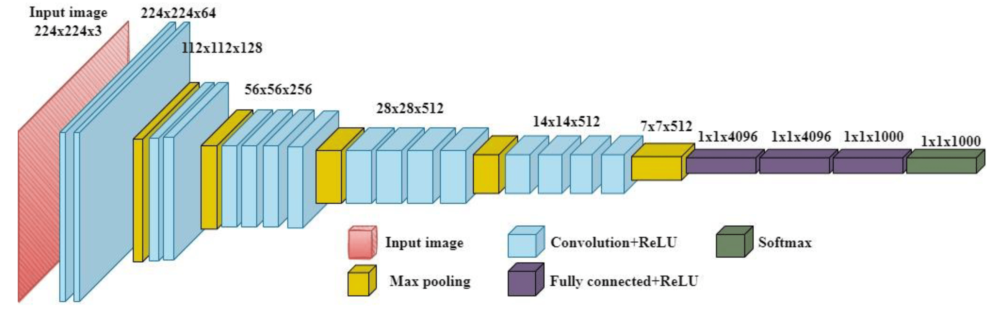

In [2]:
model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [3]:
'''
Getting Layers
'''
model.layers

In [4]:
'''
Getting Covolutional Layers
'''
for i in range (len(model.layers)):
    if 'conv' not in model.layers[i].name:
        continue
    filters,biases=model.layers[i].get_weights()
    print("Layer:", i,model.layers[i].name,filters.shape)

Layer: 1 block1_conv1 (3, 3, 3, 64)
Layer: 2 block1_conv2 (3, 3, 64, 64)
Layer: 4 block2_conv1 (3, 3, 64, 128)
Layer: 5 block2_conv2 (3, 3, 128, 128)
Layer: 7 block3_conv1 (3, 3, 128, 256)
Layer: 8 block3_conv2 (3, 3, 256, 256)
Layer: 9 block3_conv3 (3, 3, 256, 256)
Layer: 10 block3_conv4 (3, 3, 256, 256)
Layer: 12 block4_conv1 (3, 3, 256, 512)
Layer: 13 block4_conv2 (3, 3, 512, 512)
Layer: 14 block4_conv3 (3, 3, 512, 512)
Layer: 15 block4_conv4 (3, 3, 512, 512)
Layer: 17 block5_conv1 (3, 3, 512, 512)
Layer: 18 block5_conv2 (3, 3, 512, 512)
Layer: 19 block5_conv3 (3, 3, 512, 512)
Layer: 20 block5_conv4 (3, 3, 512, 512)


# Filters Visual

In [5]:
'''
Getting weights and biases
'''
filters,bias=model.layers[1].get_weights()

In [6]:
'''
Normalizing filter
'''
f_min, f_max=filters.min(),filters.max()
filters=(filters-f_min)/(f_max-f_min)

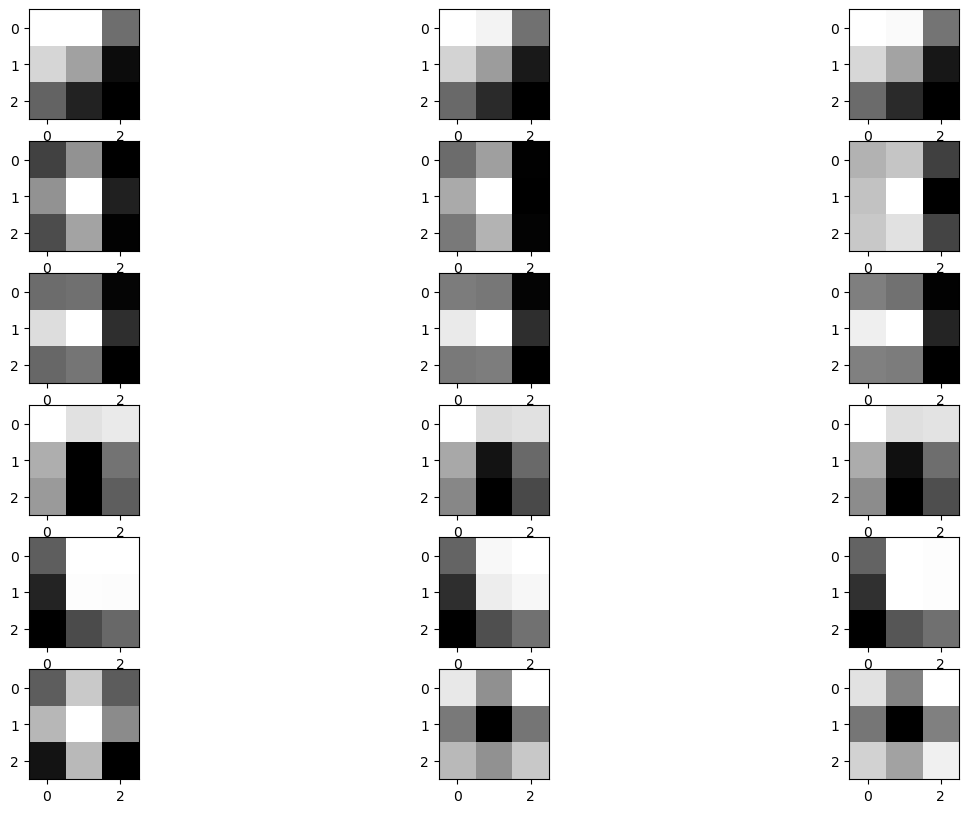

In [7]:
'''
Filters of Layer 1
'''
from matplotlib import pyplot as plt
n_filters = 6
pos = 1
fig = plt.figure(figsize=(15, 10))
for i in range(n_filters):
    f = filters[:, :, :, i]
    for j in range(3):
        plt.subplot(n_filters, 3, pos)
        plt.imshow(f[:, :, j], cmap='gray')
        pos += 1

plt.show()

# Preprocessing Image

In [8]:
'''
Preprocessing image
'''
import numpy as np
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from keras.applications.imagenet_utils import preprocess_input

image=load_img('/kaggle/input/cat-and-dog/Cat and Dog/ime.jpg',target_size=(224,224))
image=img_to_array(image)
image=np.expand_dims(image,axis=0)
image=preprocess_input(image)

# Filter's Extraction in each Layer

In [9]:
from tensorflow.keras.models import Model

layer_index=[1,2,4,5,7,8,9,10,12,13,14,15,17,18,19,20]
outputs = [model.layers[i].output for i in layer_index]
model1 = Model( inputs= model.inputs, outputs = outputs)

1/1 [==============================] - 1s 755ms/step


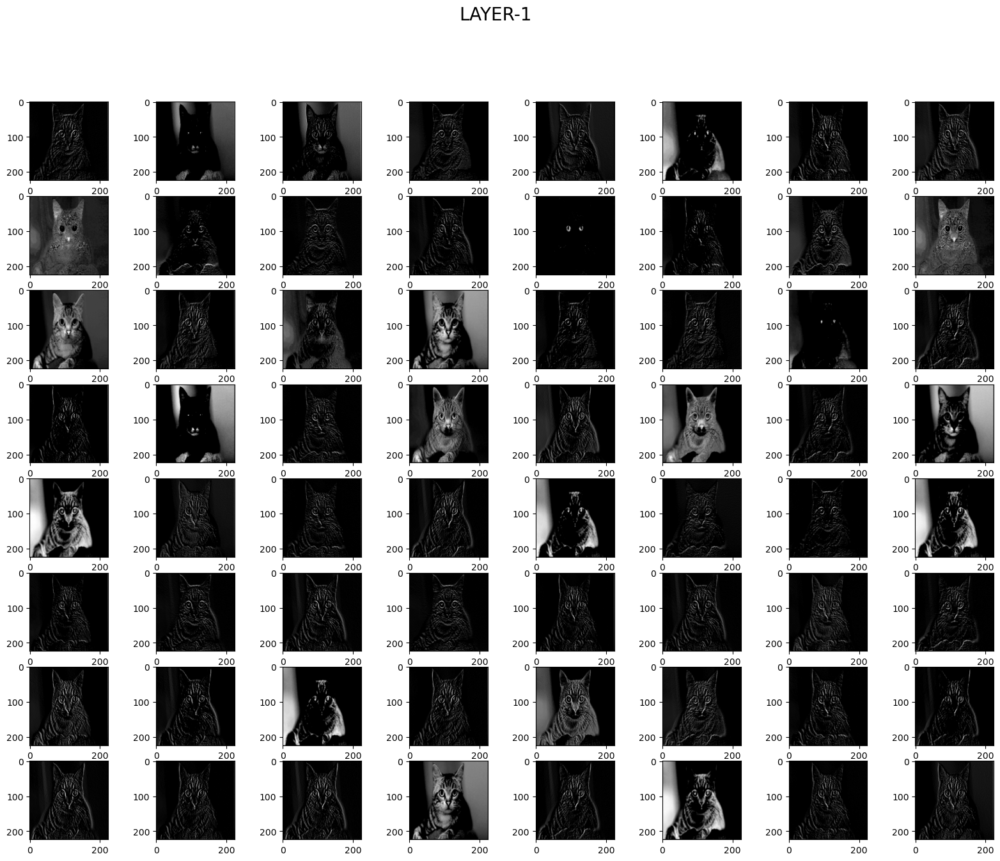

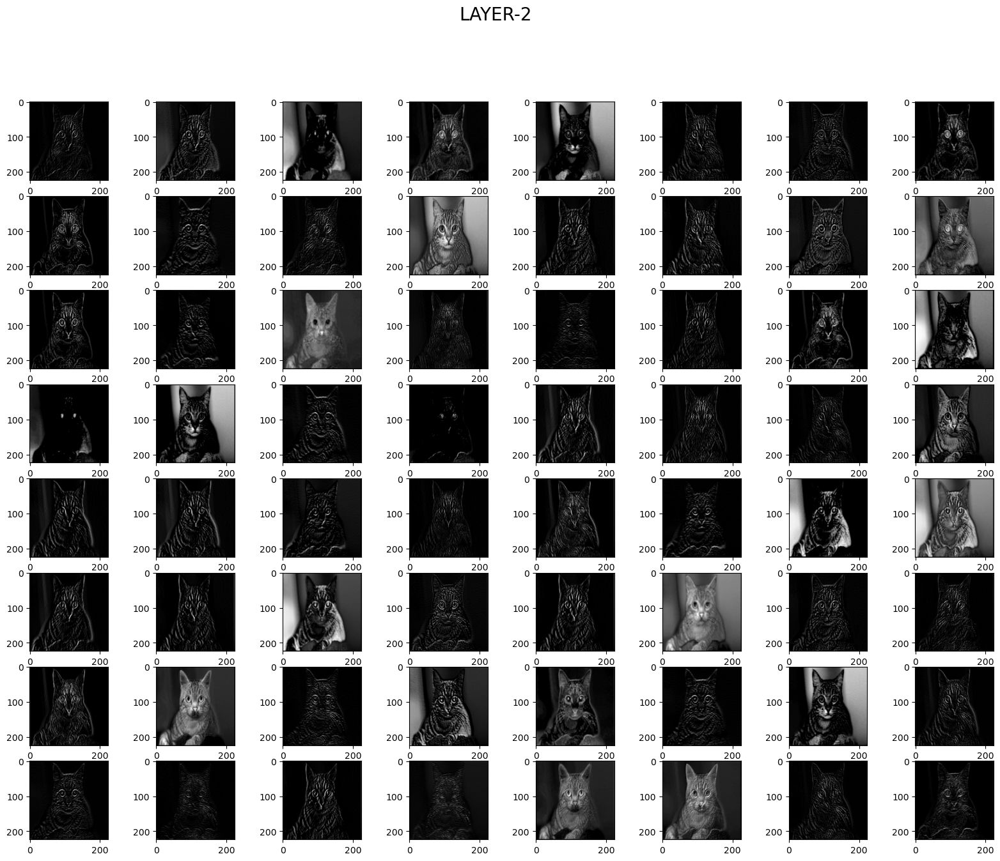

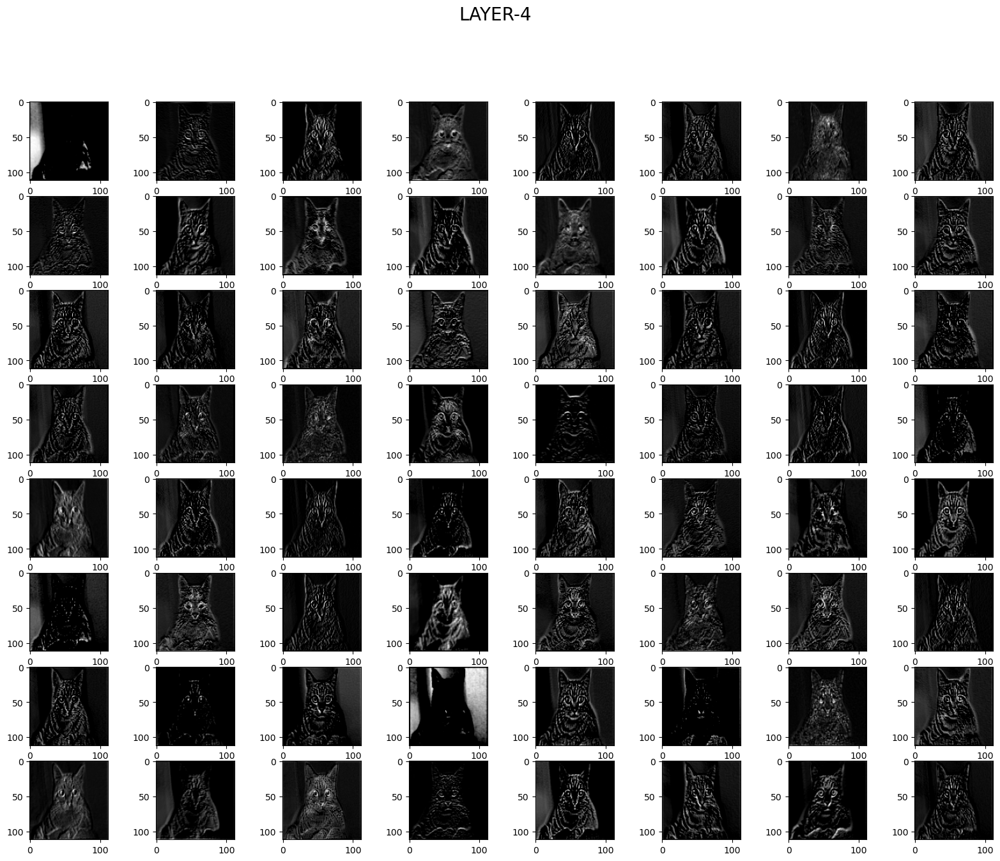

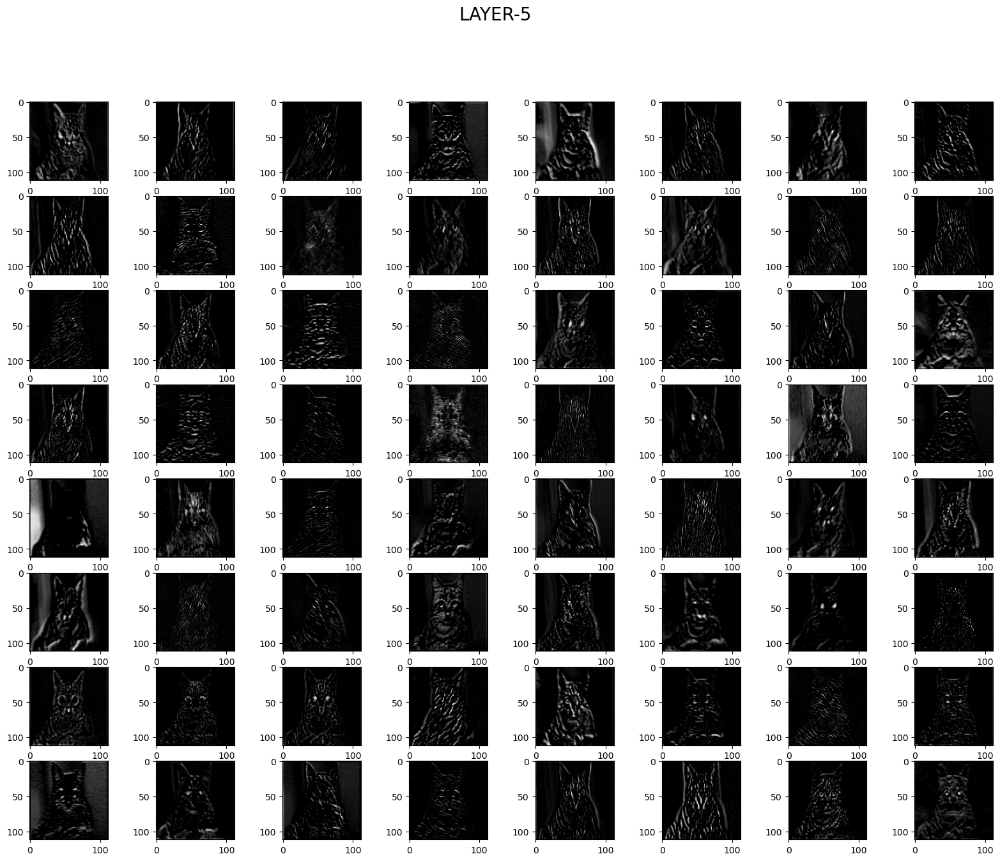

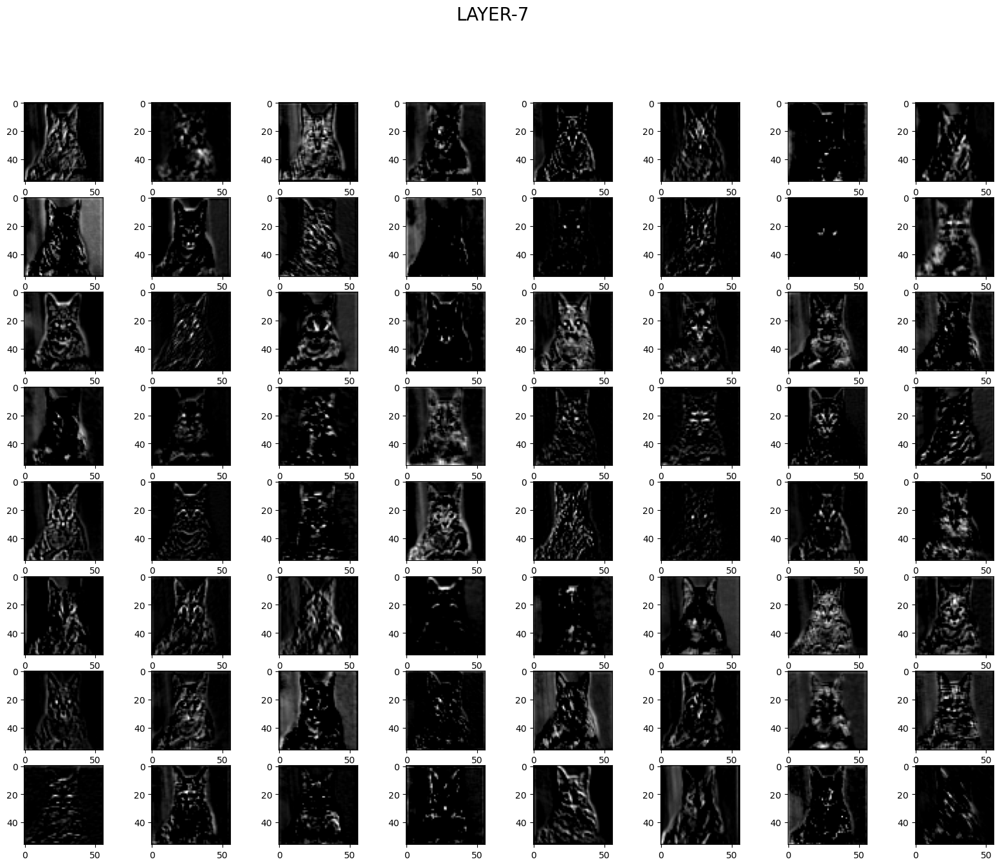

...

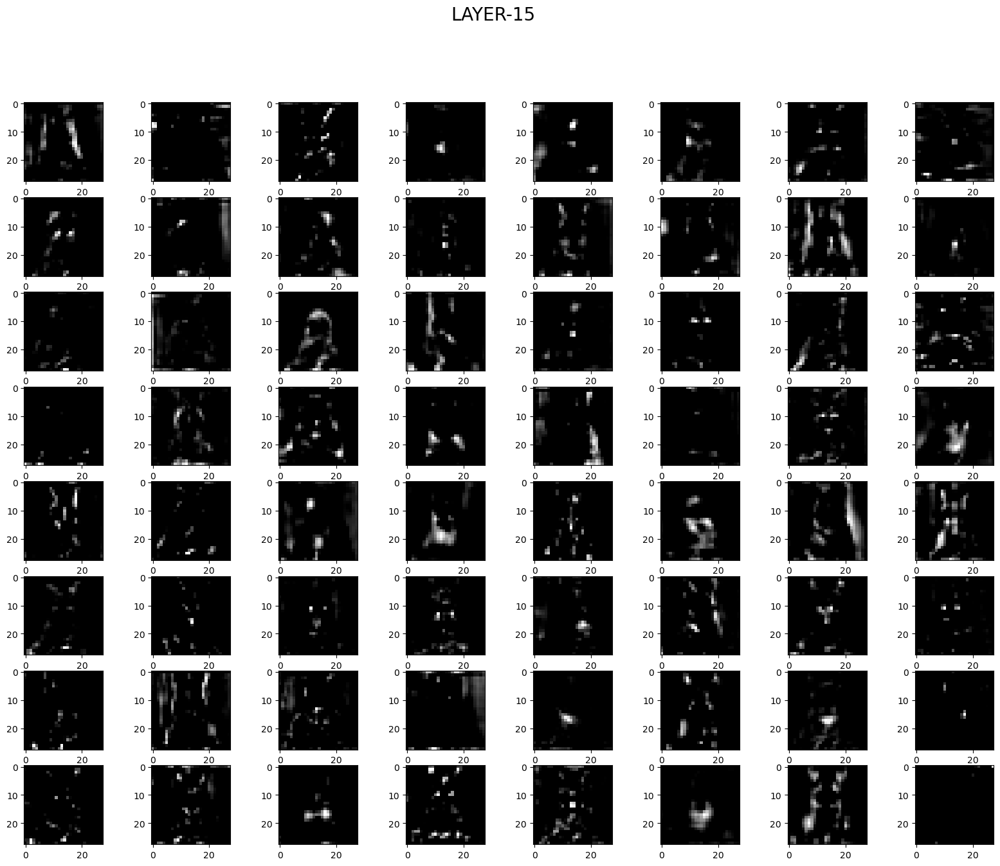

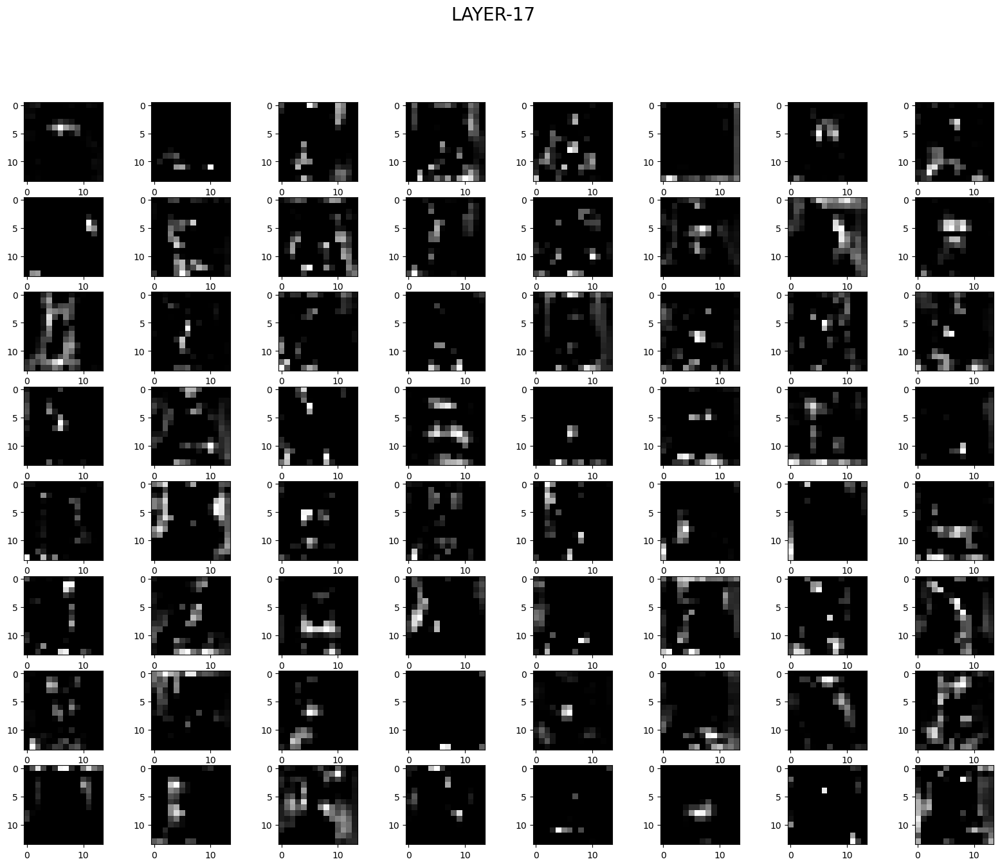

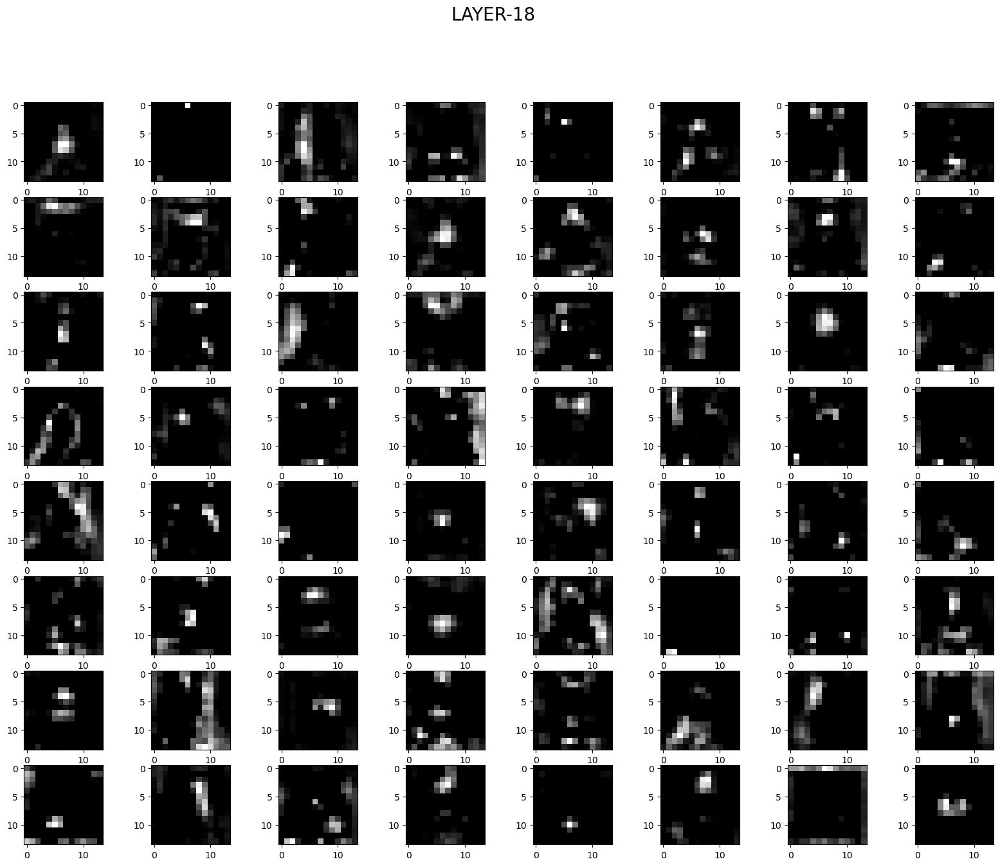

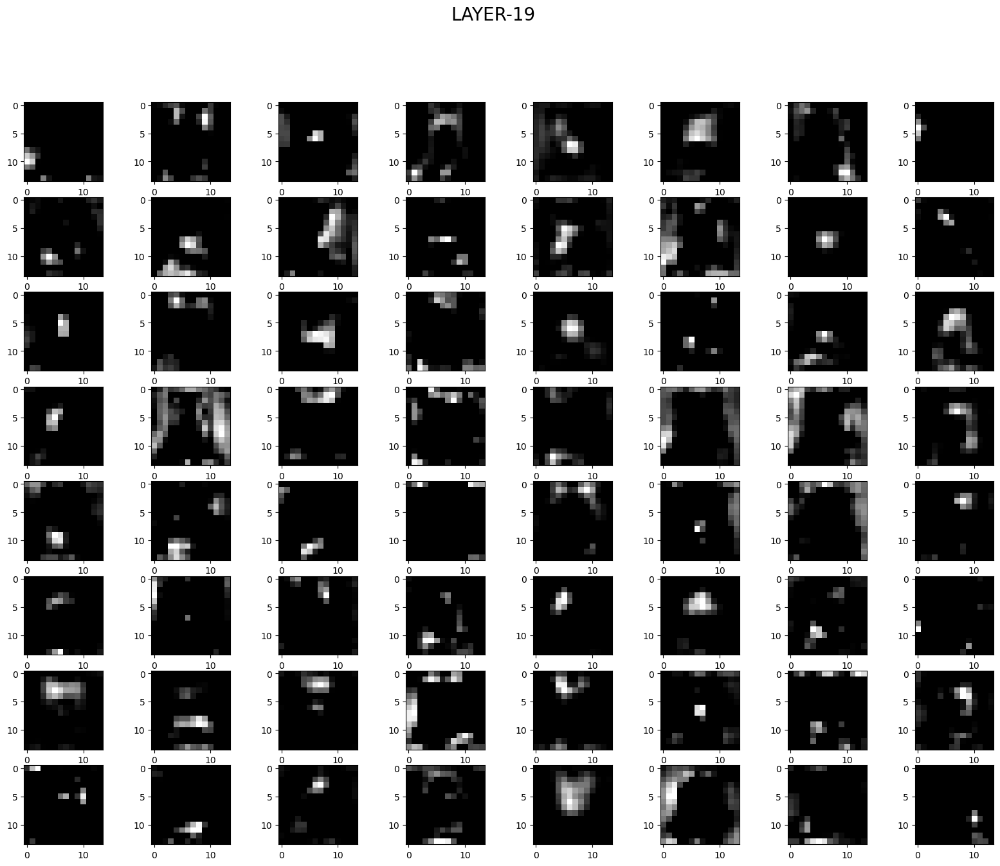

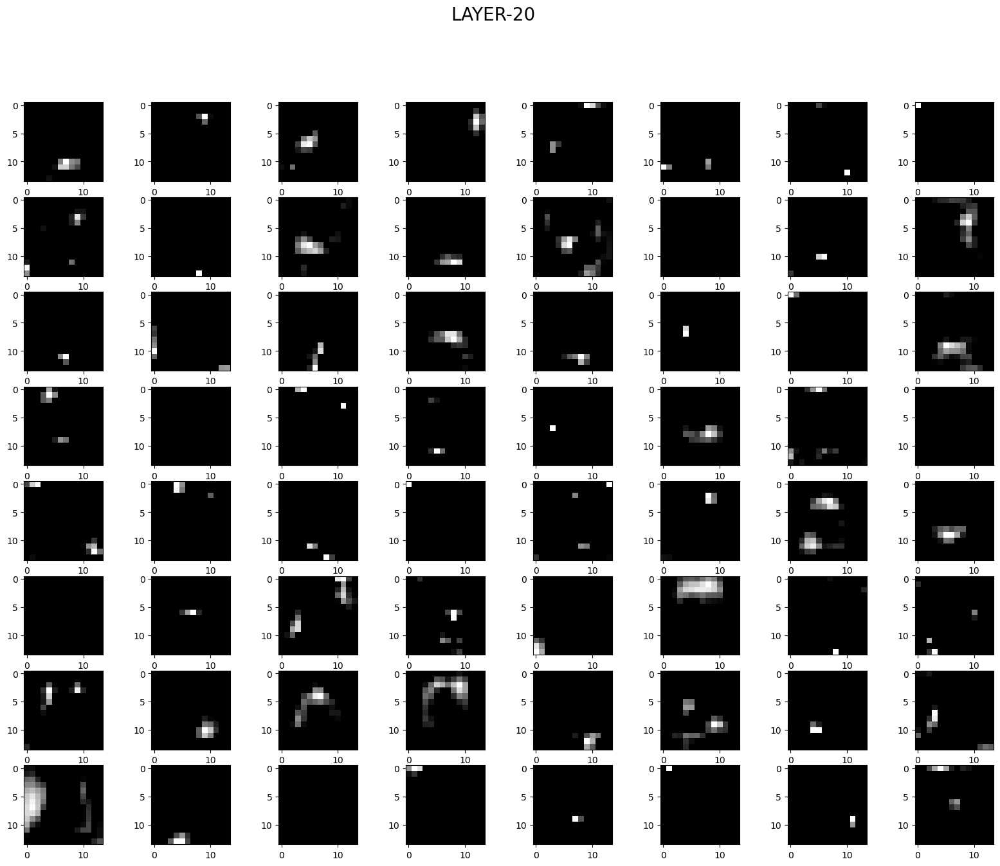

In [10]:
'''
Visualizing each Layers
'''
feature_map = model1.predict(image)

for i,fmap in zip(layer_index,feature_map):
    fig = plt.figure(figsize=(20,15))
    fig.suptitle("LAYER-{}".format(i) , fontsize=20)
    for j in range(1,65):

        plt.subplot(8,8,j)
        plt.imshow(fmap[0,:,:,j-1] , cmap='gray')
    
    plt.show()

#### <center>Clearly it is seen that General features are extracted in LAYER-20</center>